## Speed statistics

In [27]:
import os
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [32]:
# Path to the preprocessed_data folder 
preprocessed_folder = '../preprocessed_data'

# Get all files in the folder
files = []
for subfolder in os.listdir(preprocessed_folder):
    subfolder_path = os.path.join(preprocessed_folder, subfolder)
    if os.path.isdir(subfolder_path):
        files.extend([os.path.join(subfolder, f) for f in os.listdir(subfolder_path) if f.endswith('.csv')])
print(f"Found {len(files)} files in {preprocessed_folder}\n")

# Process each file
for file in sorted(files):
    file_path = os.path.join(preprocessed_folder, file)
    df = pd.read_csv(file_path)
    
    # Check if 'speed' column exists
    if 'Speed' in df.columns:
        print(f"File: {file}")
        print(f"  Count: {len(df)}")
        print(f"  Mean Speed: {df['Speed'].mean():.2f}")
        print(f"  Median Speed: {df['Speed'].median():.2f}")
        print(f"  Std Dev: {df['Speed'].std():.2f}")
        print(f"  Min Speed: {df['Speed'].min():.2f}")
        print(f"  Max Speed: {df['Speed'].max():.2f}")
        print(f"  25th Percentile: {df['Speed'].quantile(0.25):.2f}")
        print(f"  75th Percentile: {df['Speed'].quantile(0.75):.2f}")
        print()

    else:
        print(f"File: {file}")
        print(f"  Warning: 'Speed' column not found")
        print()

    

Found 92 files in ../preprocessed_data

File: TERBINAFINE+\coordinates_highestspeed_20240827_11_1_with_time_speed.csv
  Count: 19041
  Mean Speed: 4.06
  Median Speed: 0.62
  Std Dev: 7.29
  Min Speed: 0.00
  Max Speed: 32.00
  25th Percentile: 0.24
  75th Percentile: 3.10

File: TERBINAFINE+\coordinates_highestspeed_20240827_11_2_with_time_speed.csv
  Count: 57678
  Mean Speed: 1.95
  Median Speed: 0.59
  Std Dev: 4.07
  Min Speed: 0.00
  Max Speed: 104.61
  25th Percentile: 0.20
  75th Percentile: 1.67

File: TERBINAFINE+\coordinates_highestspeed_20240827_11_3_with_time_speed.csv
  Count: 63777
  Mean Speed: 1.16
  Median Speed: 0.40
  Std Dev: 5.63
  Min Speed: 0.00
  Max Speed: 864.31
  25th Percentile: 0.14
  75th Percentile: 1.06

File: TERBINAFINE+\coordinates_highestspeed_20240827_11_4_with_time_speed.csv
  Count: 56836
  Mean Speed: 0.97
  Median Speed: 0.31
  Std Dev: 3.04
  Min Speed: 0.00
  Max Speed: 438.75
  25th Percentile: 0.11
  75th Percentile: 0.84

File: TERBINAFINE

C:\Users\mbera\AppData\Local\Temp\ipykernel_21228\3782815540.py:15: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


File: TERBINAFINE- (control)\coordinates_highestspeed_20250205_12_4_with_time_speed.csv
  Count: 65923
  Mean Speed: 2.16
  Median Speed: 0.93
  Std Dev: 3.39
  Min Speed: 0.00
  Max Speed: 89.03
  25th Percentile: 0.32
  75th Percentile: 2.53

File: TERBINAFINE- (control)\coordinates_highestspeed_20250205_12_5_with_time_speed.csv
  Count: 70721
  Mean Speed: 1.78
  Median Speed: 0.65
  Std Dev: 3.09
  Min Speed: 0.00
  Max Speed: 55.59
  25th Percentile: 0.20
  75th Percentile: 2.01

File: TERBINAFINE- (control)\coordinates_highestspeed_20250318_10_2_with_time_speed.csv
  Count: 91622
  Mean Speed: 1.48
  Median Speed: 0.40
  Std Dev: 3.05
  Min Speed: 0.00
  Max Speed: 117.98
  25th Percentile: 0.15
  75th Percentile: 1.37

File: TERBINAFINE- (control)\coordinates_highestspeed_20250318_10_4_with_time_speed.csv
  Count: 73948
  Mean Speed: 1.35
  Median Speed: 0.54
  Std Dev: 2.25
  Min Speed: 0.00
  Max Speed: 31.65
  25th Percentile: 0.19
  75th Percentile: 1.56

File: TERBINAFINE- 

## Speed distribution

In [4]:
# Plots Speed, ComputedSpeed_frames, and ComputedSpeed_timestamp by row for each file
# Side by side with median/quartile lines and statistics displayed below

def plot_speed_comparison(tail=None):
    
    fig, axes = plt.subplots(1, 3, figsize=(20, 6), constrained_layout=True)
    fig.suptitle(f"Speed Comparisons - {file}", fontsize=16)

    columns = ['Speed', 'ComputedSpeed_frames', 'ComputedSpeed_timestamp']
    colors = ['tab:blue', 'orange', 'green']
    titles = ['Original Speed', 'Computed Speed (Frames)', 'Computed Speed (Timestamp)']


    for i, col in enumerate(columns):
        if col in df.columns:
            data = df[col]
            median = data.median()
            q1 = data.quantile(0.25)
            q3 = data.quantile(0.75)
            mean = data.mean()
            std_dev = data.std()
            mean_plus_std = mean + std_dev

            plotted_data = data.tail(tail) if tail is not None else data


            # Plot data
            axes[i].plot(plotted_data, marker='o', linestyle='-', markersize=2, color=colors[i], alpha=0.6)
            
            # Add Horizontal Lines
            axes[i].axhline(median, color='red', linestyle='--', label=f'Median: {median:.2f}')
            axes[i].axhline(q1, color='black', linestyle=':', alpha=0.7, label=f'Q1: {q1:.2f}')
            axes[i].axhline(q3, color='black', linestyle=':', alpha=0.7, label=f'Q3: {q3:.2f}')
            axes[i].axhline(mean, color='blue', linestyle='-', alpha=0.7, label=f'Mean: {mean:.2f}')
            axes[i].axhline(mean_plus_std, color='purple', linestyle='-.', alpha=0.7, label=f'Mean + Std Dev: {mean_plus_std:.2f}')
            
            axes[i].set_title(titles[i])
            axes[i].set_xlabel("Row Number")
            axes[i].set_ylabel("Speed")
            axes[i].grid(True, alpha=0.3)
            axes[i].legend(loc='upper right', fontsize='small')

            # Add statistics text below the plot including std dev
            stats_text = f"Median: {median:.2f} | IQR: {q3 - q1:.2f} | Mean: {mean:.2f} | Std Dev: $\mathbf{{{std_dev:.2f}}}$"
            axes[i].text(0.5, -0.25, stats_text, transform=axes[i].transAxes, 
                         ha='center', va='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
        else:
            axes[i].text(0.5, 0.5, f"'{col}' not found", ha='center', va='center')
            axes[i].axis('off')

    plt.show()

    



<>:44: SyntaxWarning: "\m" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\m"? A raw string is also an option.
<>:44: SyntaxWarning: "\m" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\m"? A raw string is also an option.
C:\Users\mbera\AppData\Local\Temp\ipykernel_21228\3301998321.py:44: SyntaxWarning: "\m" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\m"? A raw string is also an option.
  stats_text = f"Median: {median:.2f} | IQR: {q3 - q1:.2f} | Mean: {mean:.2f} | Std Dev: $\mathbf{{{std_dev:.2f}}}$"


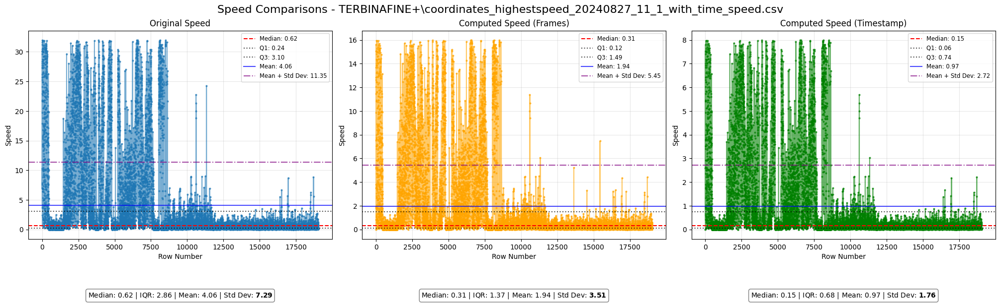

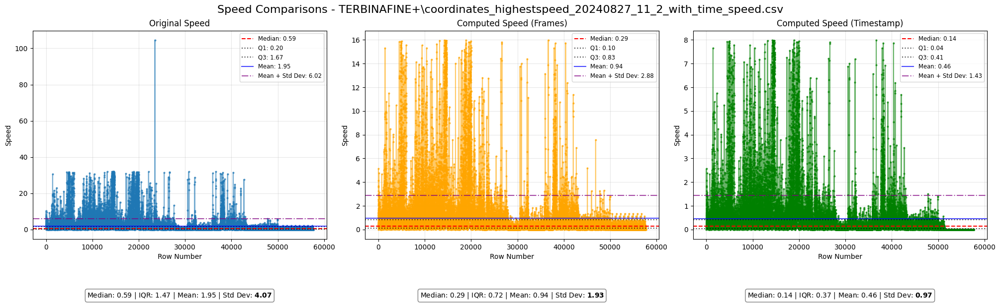

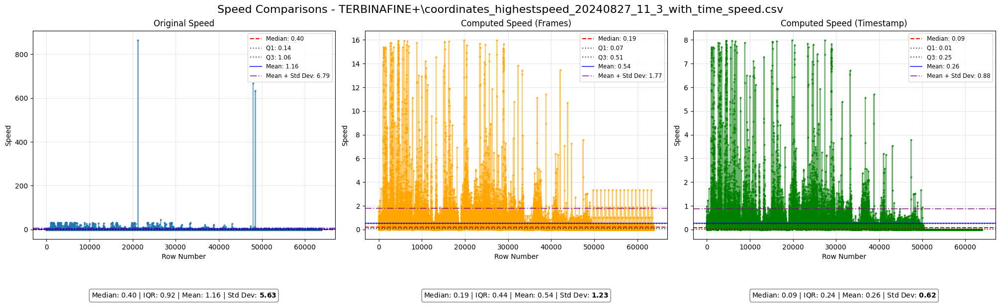

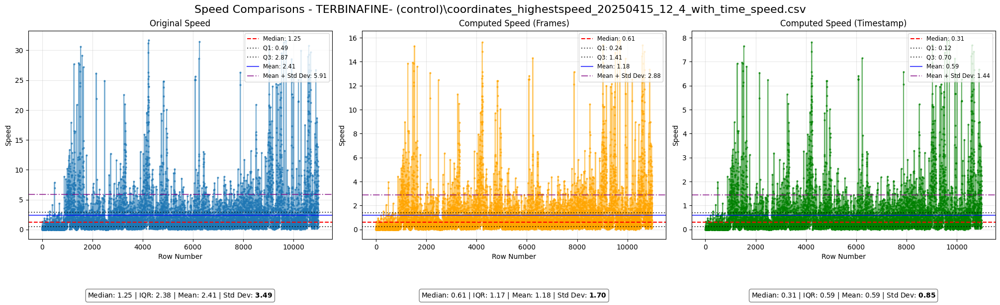

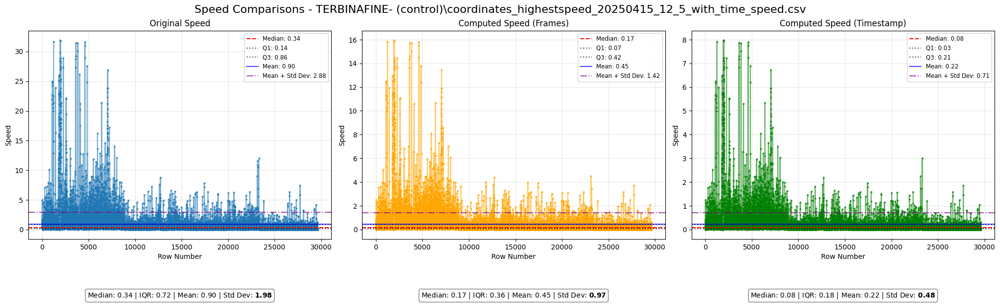

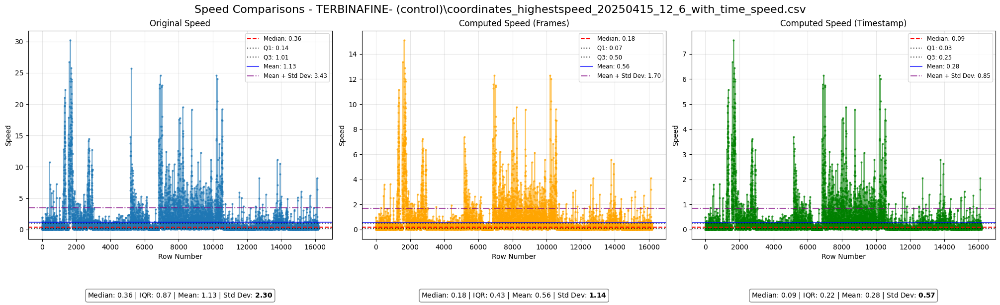

In [5]:
for file in sorted(files)[0:3] + sorted(files)[-3:]: 
    file_path = os.path.join(preprocessed_folder, file)
    df = pd.read_csv(file_path)
    plot_speed_comparison()

## End of life speed distribution

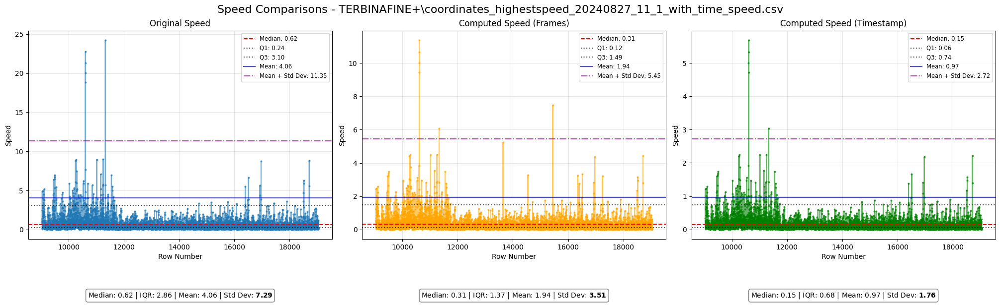

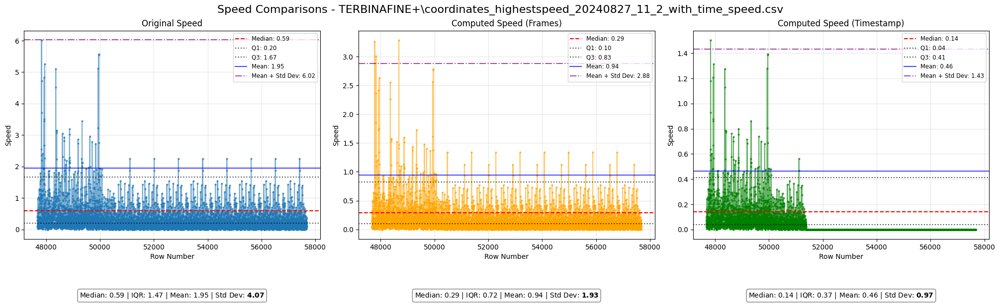

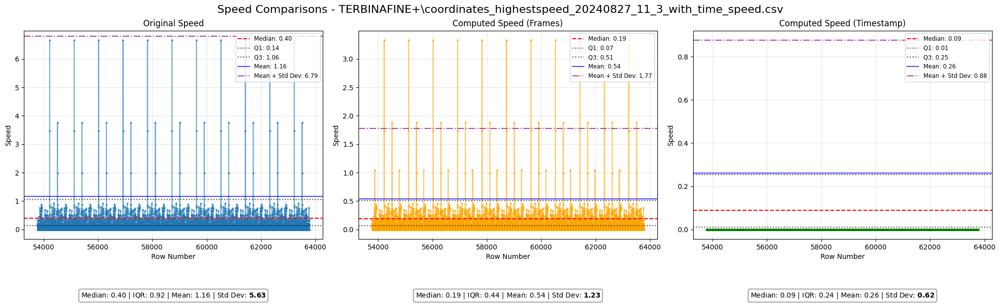

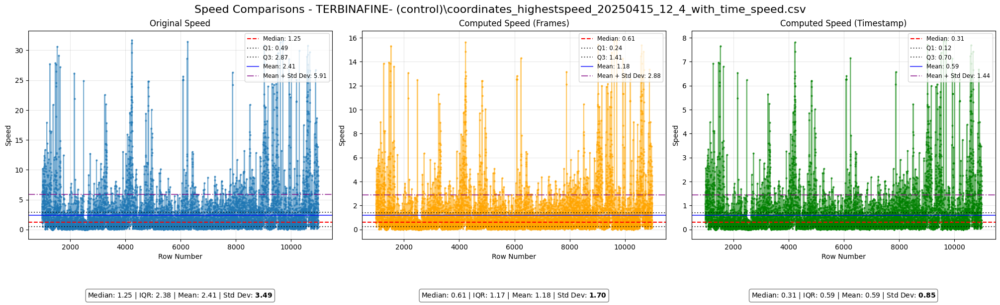

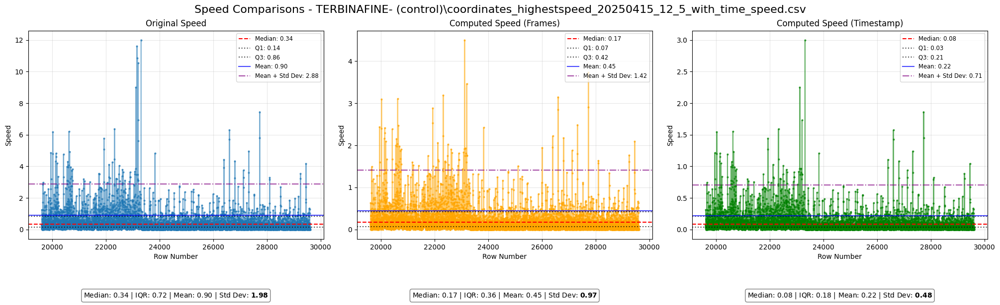

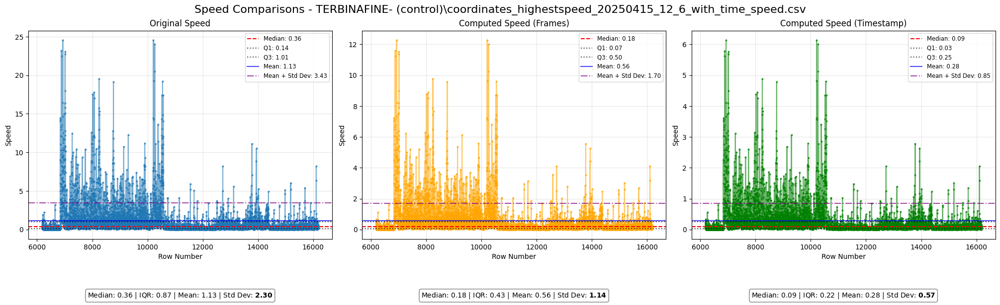

In [6]:
# keep only last 10000 rows of each files

for file in sorted(files)[0:3] + sorted(files)[-3:]: 
    file_path = os.path.join(preprocessed_folder, file)
    df = pd.read_csv(file_path)
    plot_speed_comparison(tail=10000)

## Coordinates constrained in radius analysis

In [7]:
def compute_cumulative_distance(file_path, freq1=100, freq2=10, n=50):
    df = pd.read_csv(file_path)
    cumulative_distances = []
    for i in range(0, len(df) - freq1, freq1):
        # print(f"Processing row {i}...")
        p0 = df.loc[i, ['X', 'Y']].values
        cumulative_distance = 0
        for j in range(i + freq2, min(i + n*freq2, len(df)), freq2):
            # print(f"  Comparing to row {j}...")
            pi = df.loc[j, ['X', 'Y']].values
            distance = np.linalg.norm(pi - p0)
            cumulative_distance += distance
        cumulative_distances.append(cumulative_distance)
        # print(f"  Cumulative distance for row {i}: {cumulative_distance:.2f}")
    
    # Cap the cumulative distances to 3 quartiles to avoid outliers dominating the plot
    q3 = np.percentile(cumulative_distances, 75)
    cumulative_distances = [d if d <= q3 else q3 for d in cumulative_distances]

    plt.figure(figsize=(10, 4))
    plt.plot(cumulative_distances, marker='o', linestyle='-', markersize=4)
    plt.title(f"Cumulative Distance - {os.path.basename(file_path)}")
    plt.xlabel(f"Index (every {freq1} rows)")
    plt.ylabel(f"Cumulative Distance on next {n} points every {freq2} rows")
    plt.grid(True, alpha=0.3)
    plt.show()
    return cumulative_distances

#### Looking for the smallest forward period that allows to have a cumulative distance near to 0 ONLY at the end of life.

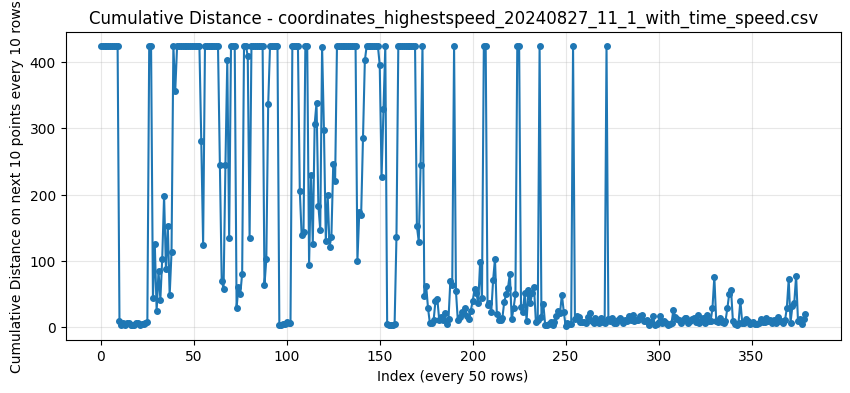

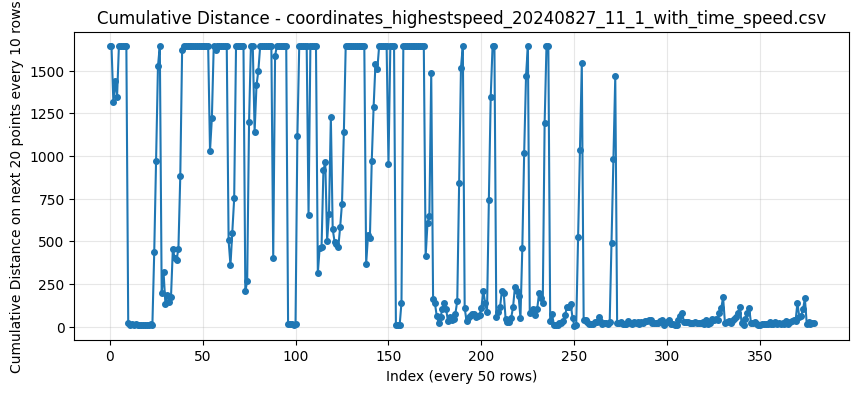

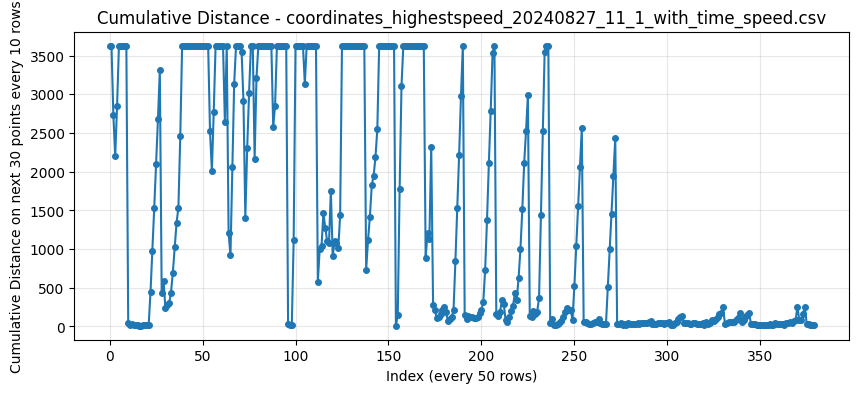

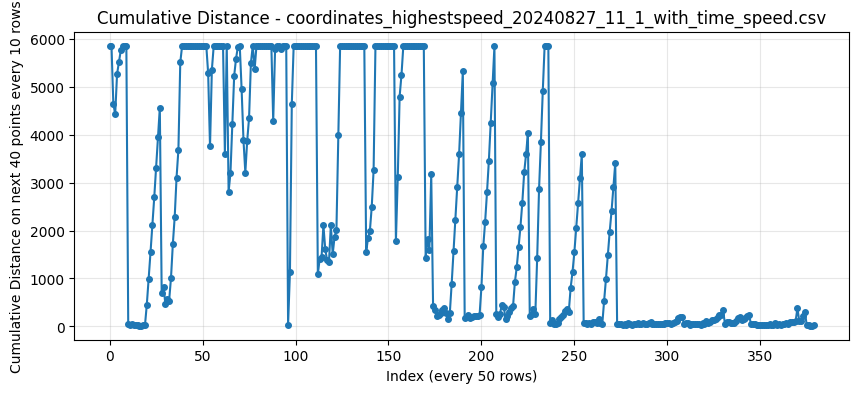

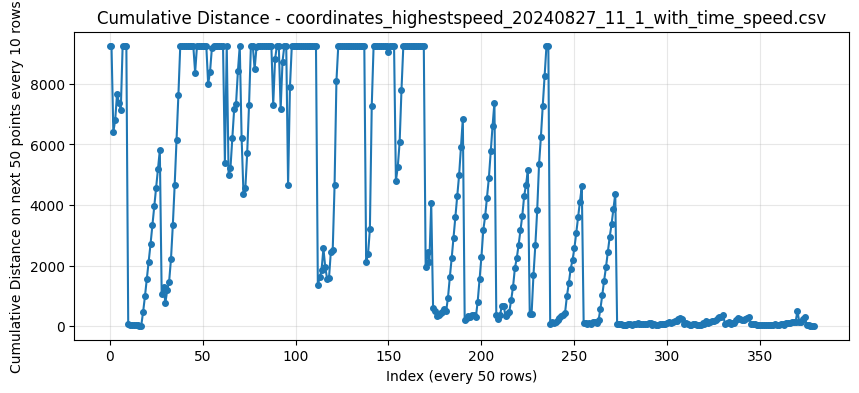

...

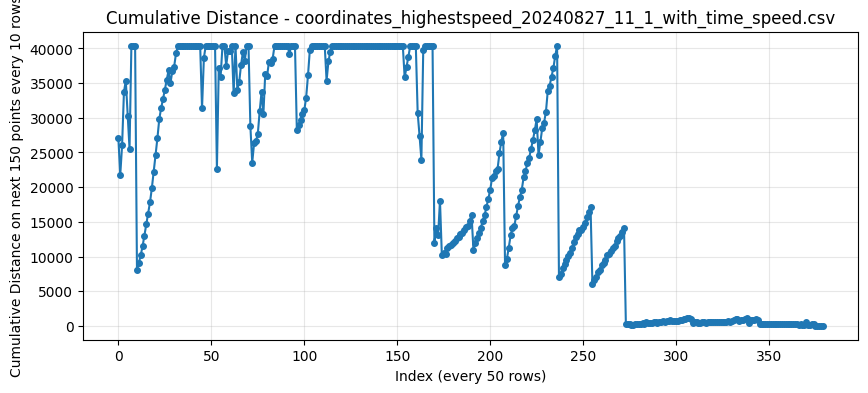

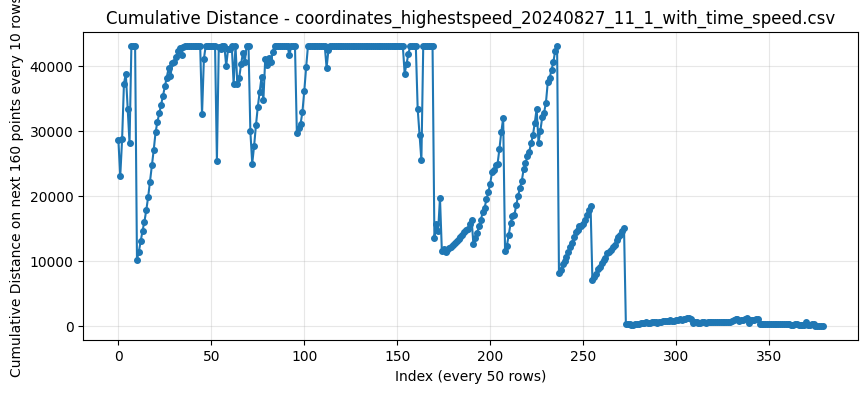

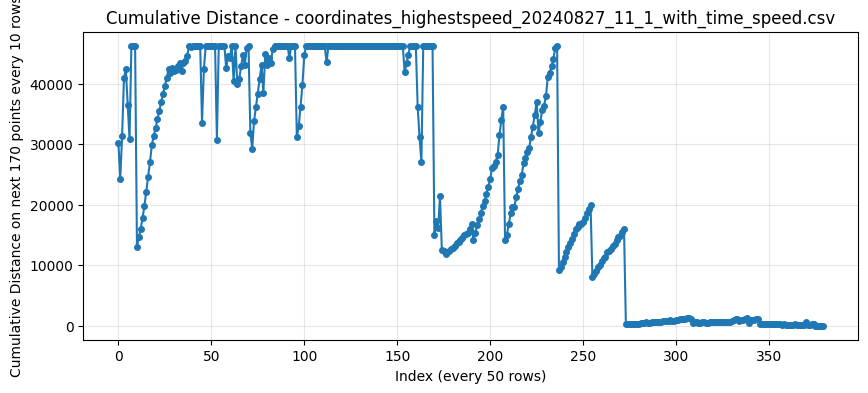

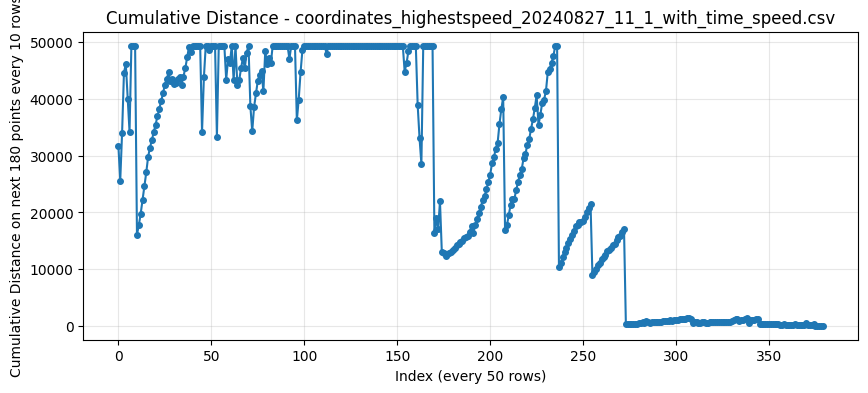

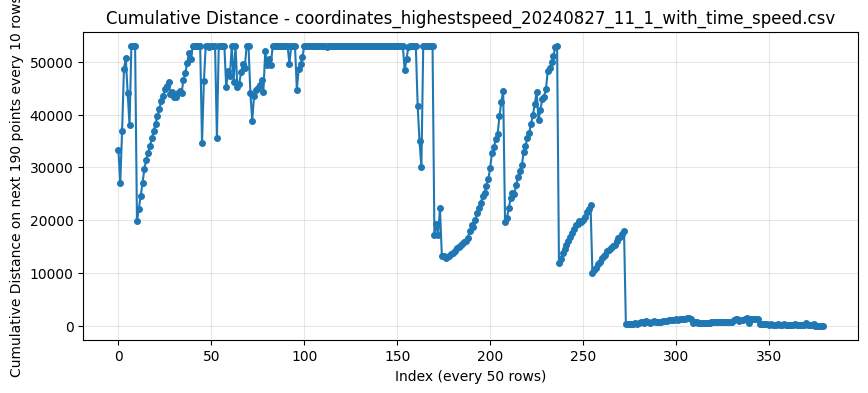

In [8]:
file_path = os.path.join(preprocessed_folder, sorted(files)[0])
    
for i in range(10, 200, 10):
    cumulative_distances = compute_cumulative_distance(file_path, freq1=50, freq2=10, n=i)


From this comparison, we can see there is a tilt when comparing less or more than a thousand rows. Less than a thousand rows let some middle life cumulate distances be near to 0, but above 1000 only end of life cumulate distances are near to 0. 

#### Looking for the least number of rows necessary to have a non-zero cumulative distance elsewhere than the end of life, for a 1000+ rows interval.

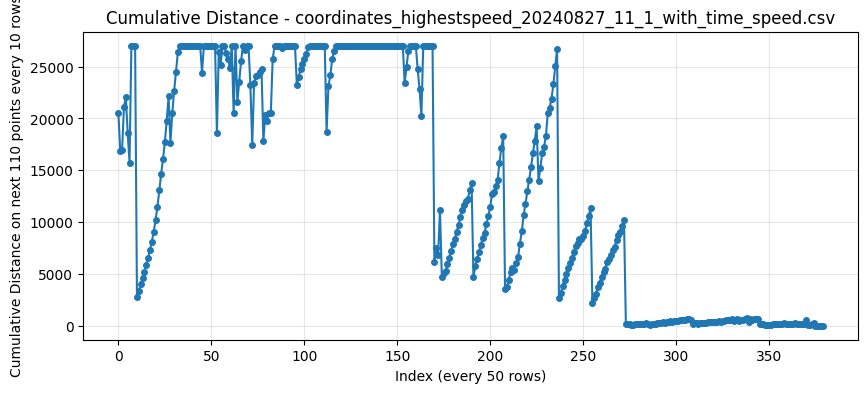

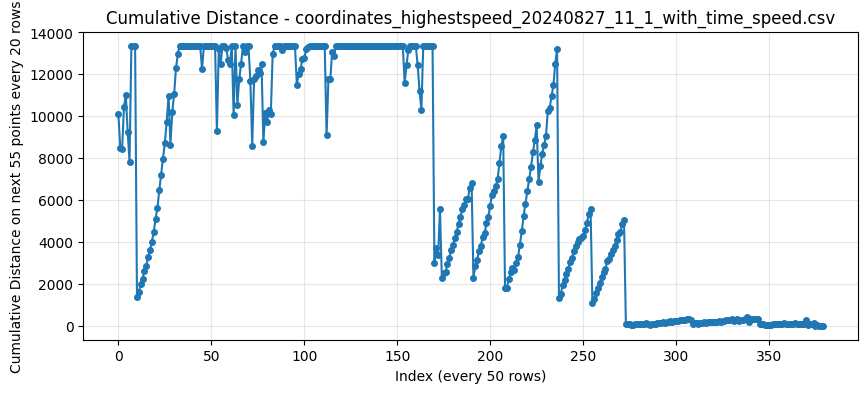

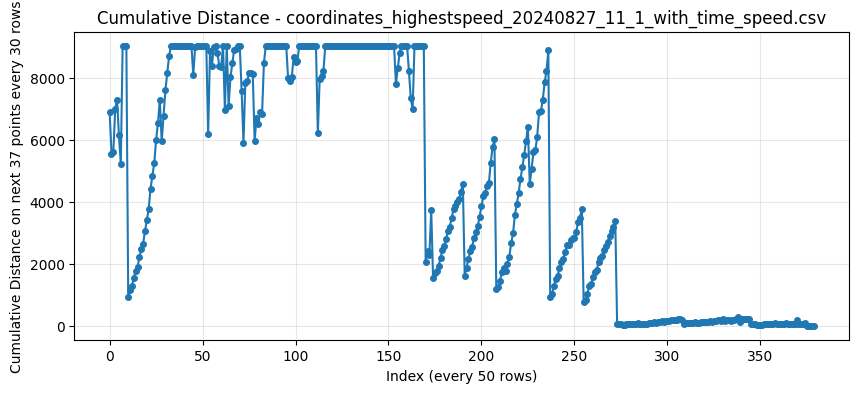

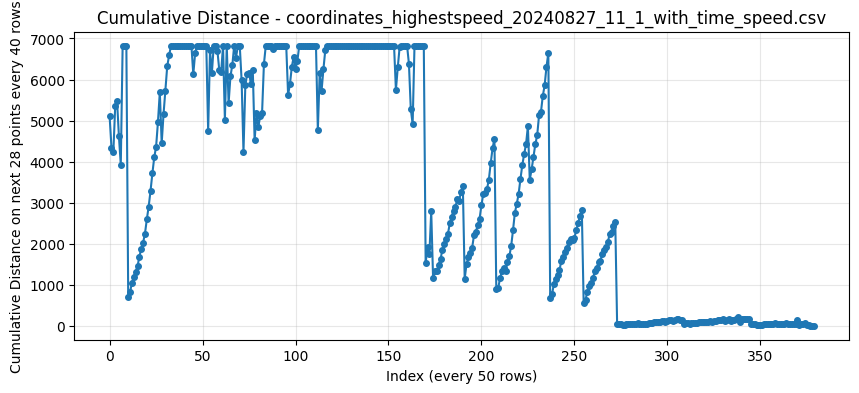

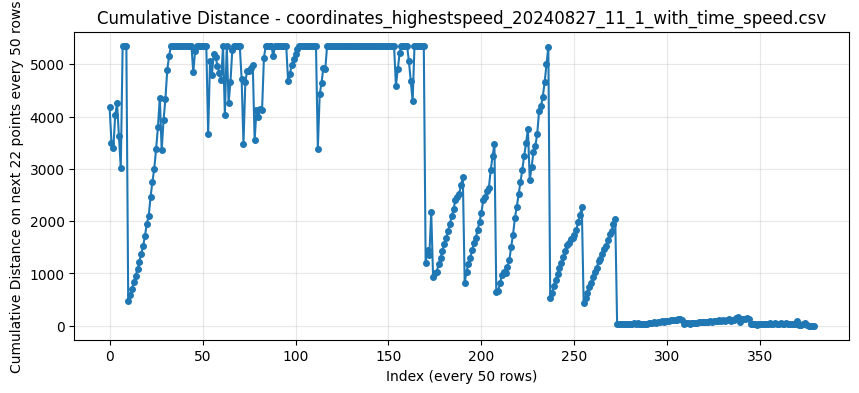

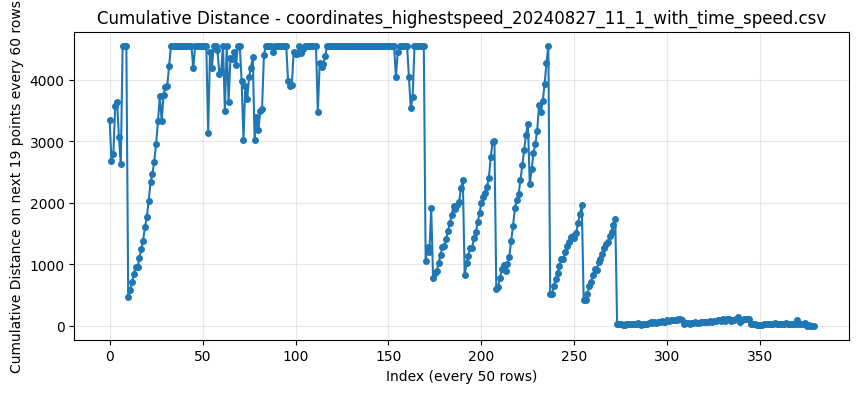

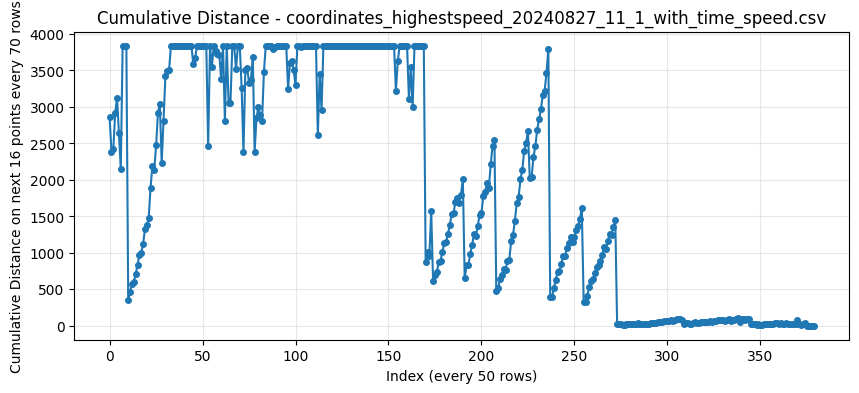

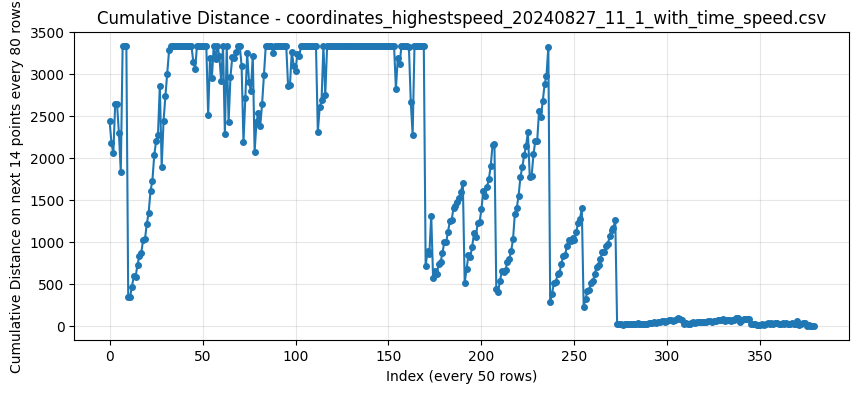

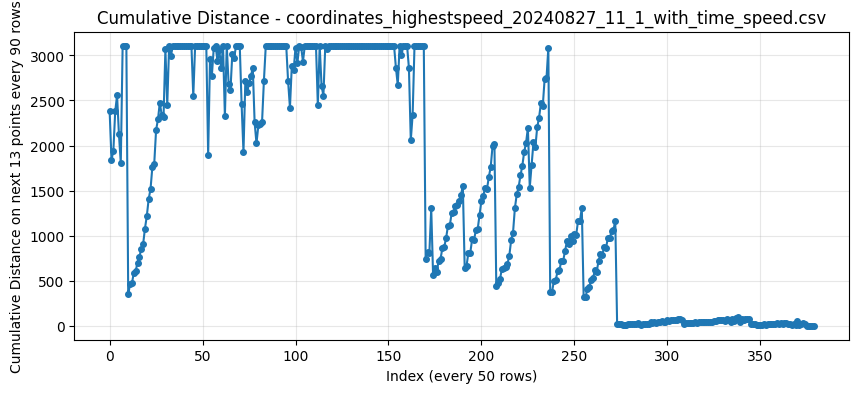

In [9]:
file_path = os.path.join(preprocessed_folder, sorted(files)[0])
    
for i in range(10, 100, 10):
    n = np.ceil(1100/i).astype(int)
    cumulative_distances = compute_cumulative_distance(file_path, freq1=50, freq2=i, n=n)

We see that the tendencies are quite similar among the different amount of rows counted in cumulative distance, for a scope on the next 1100 rows.

#### Let's verify this behavior on all the files.

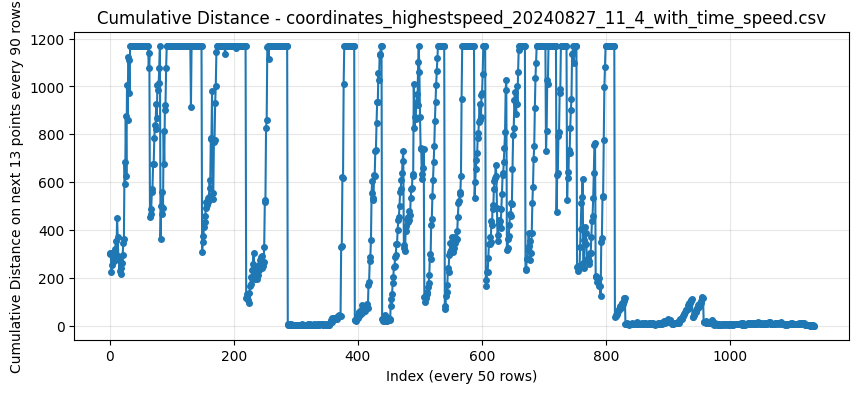

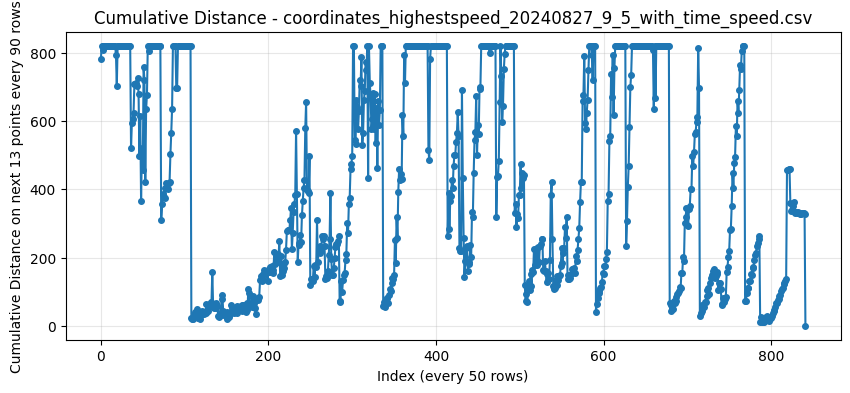

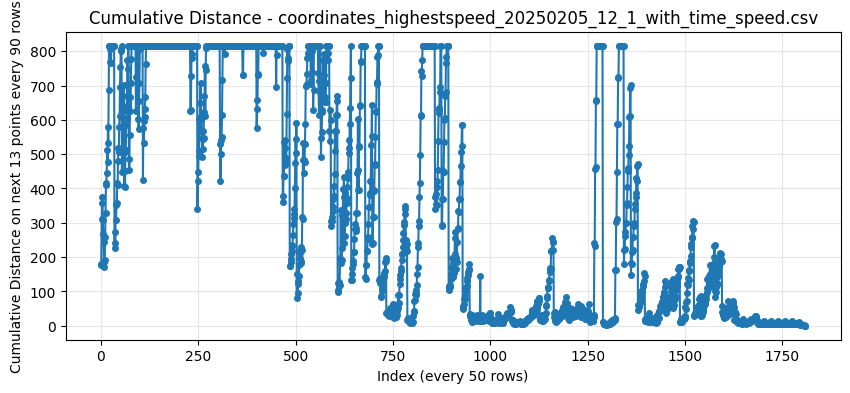

In [25]:
# for file in sorted(files):
#     file_path = os.path.join(preprocessed_folder, file)
#     cumulative_distances = compute_cumulative_distance(file_path, freq1=50, freq2=90, n=13)

# Only some relevant examples:
files1 = [sorted(files)[3], sorted(files)[6], sorted(files)[69]]

for file in files1 :
    file_path = os.path.join(preprocessed_folder, file)
    cumulative_distances = compute_cumulative_distance(file_path, freq1=50, freq2=90, n=13)

As we can see generalizing on all files, the cumulative distance near 0 is not only at the end of life with these settings, let's try to retune them.

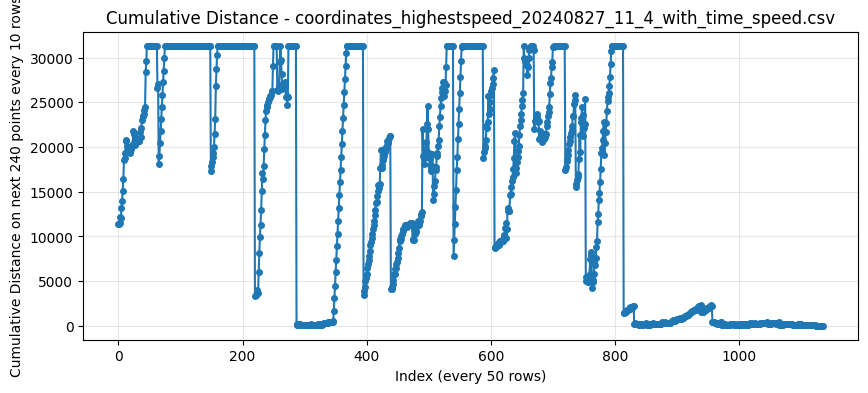

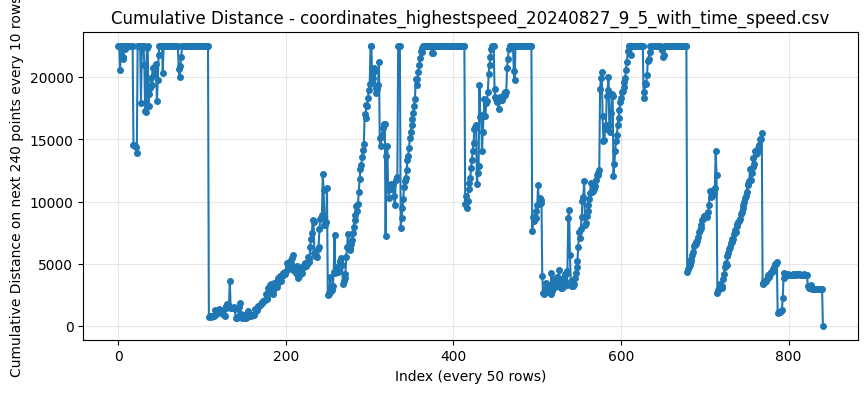

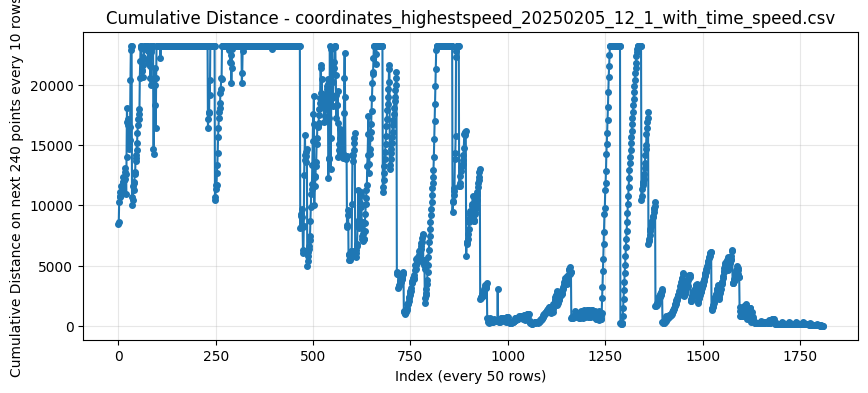

In [11]:
for file in files1 :
    file_path = os.path.join(preprocessed_folder, file)
    cumulative_distances = compute_cumulative_distance(file_path, freq1=50, freq2=10, n=240)

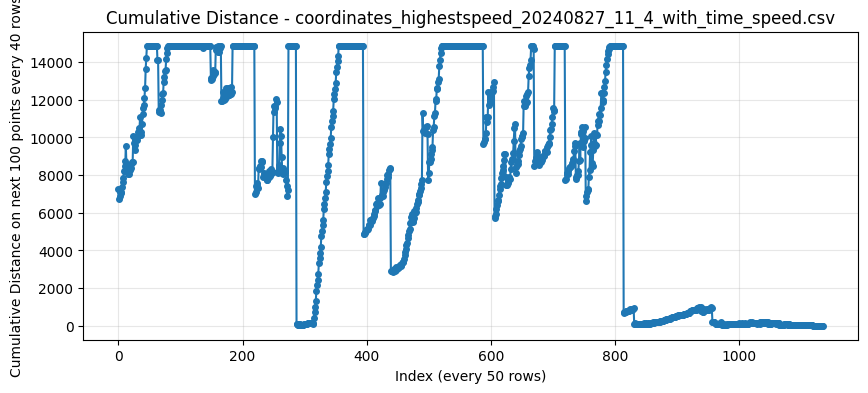

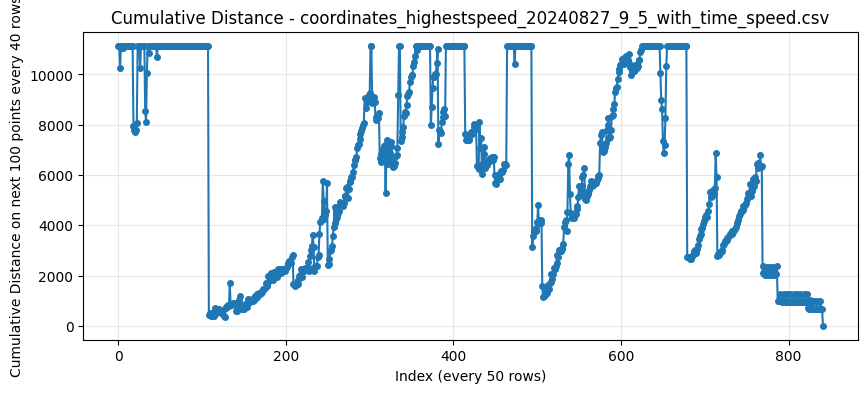

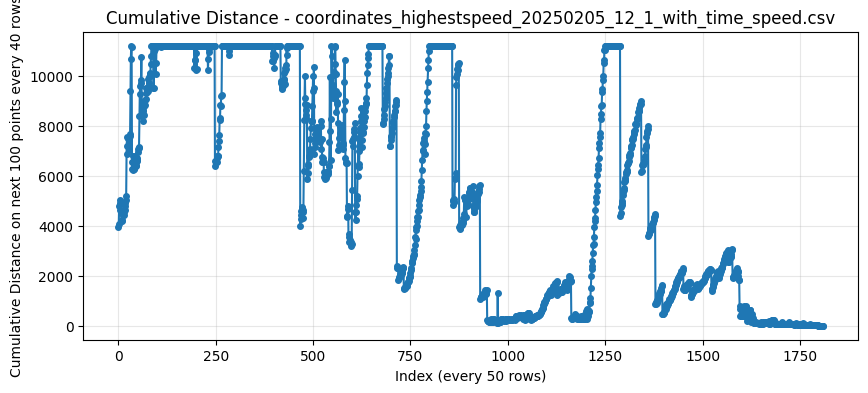

In [12]:
for file in files1 :
    file_path = os.path.join(preprocessed_folder, file)
    cumulative_distances = compute_cumulative_distance(file_path, freq1=50, freq2=40, n=100)

We can see that cumulative distances even for huge forward periods (4000 rows) can still be near to 0 elsewhere than the end of life. For this reason, we will look at the cumulative distance on the whole remaining dataset instead of forward periods.

#### Cumulative distance to the end of dataset

In [15]:
def compute_total_cumulative_distance(file_path, freq1=500, freq2=100):
    df = pd.read_csv(file_path)
    cumulative_distances = []
    for i in range(0, len(df) - freq1, freq1):
        # print(f"Processing row {i}...")
        p0 = df.loc[i, ['X', 'Y']].values
        cumulative_distance = 0
        for j in range(i + freq2, len(df), freq2):
            # print(f"  Comparing to row {j}...")
            pi = df.loc[j, ['X', 'Y']].values
            distance = np.linalg.norm(pi - p0)
            cumulative_distance += distance
        cumulative_distances.append(cumulative_distance)
        # print(f"  Cumulative distance for row {i}: {cumulative_distance:.2f}")
    
    # Cap the cumulative distances to 3 quartiles to avoid outliers dominating the plot
    q3 = np.percentile(cumulative_distances, 75)
    cumulative_distances = [d if d <= q3 else q3 for d in cumulative_distances]

    plt.figure(figsize=(10, 4))
    plt.plot(cumulative_distances, marker='o', linestyle='-', markersize=4)
    plt.title(f"Cumulative Distance - {os.path.basename(file_path)}")
    plt.xlabel(f"Index (every {freq1} rows)")
    plt.ylabel(f"Cumulative Distance until end of dataset every {freq2} rows")
    plt.grid(True, alpha=0.3)
    plt.show()
    return cumulative_distances

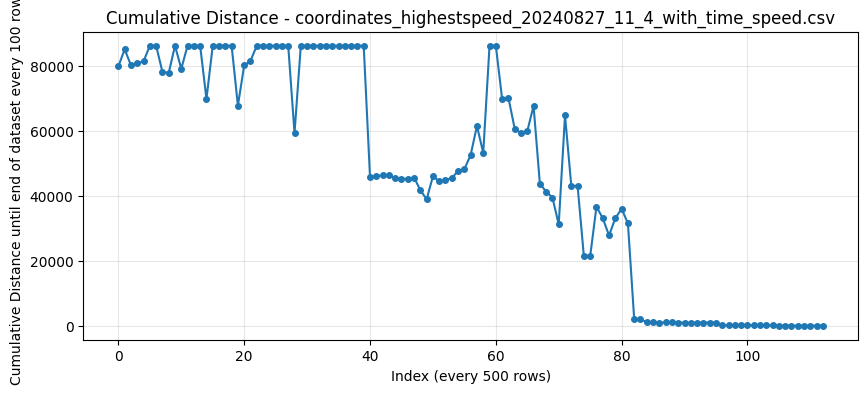

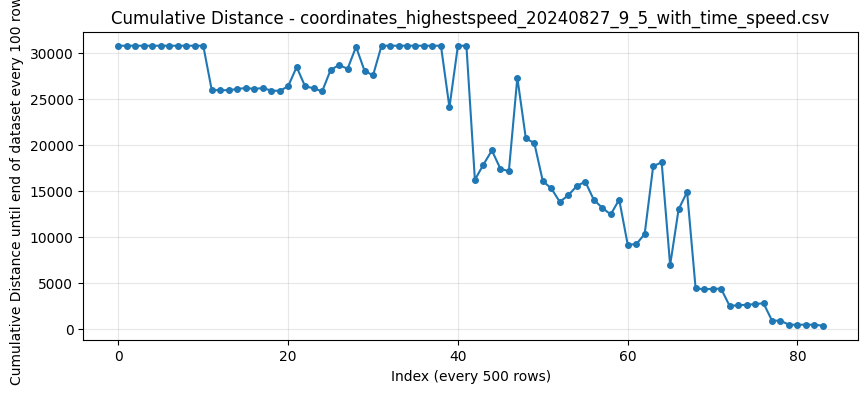

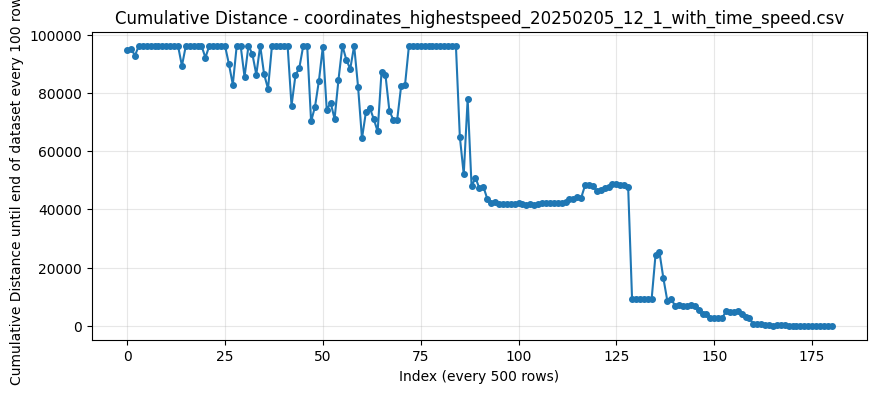

In [16]:
for file in files1 :
    file_path = os.path.join(preprocessed_folder, file)
    cumulative_distances = compute_total_cumulative_distance(file_path, freq1=500, freq2=100)

This technique might be heavy but insures a relevant indicator of the worm becoming static due to its age. For now it might still be sensible to outliers, let's try to smooth the distances. 

In [39]:
def compute_total_smooth_cumulative_distance(file_path, freq1=500, freq2=100, smoothing_window=15):
    df = pd.read_csv(file_path)

    cumulative_distances_1 = []
    cumulative_distances_2 = []
    cumulative_distances_3 = []

    for i in range(0, len(df) - freq1, freq1):
        # print(f"Processing row {i}...")
        p0_1 = df.loc[i, ['X', 'Y']].values
        p0_2 = df.loc[i+smoothing_window, ['X', 'Y']].values
        p0_3 = df.loc[i+2*smoothing_window, ['X', 'Y']].values

        cumulative_distance_1 = 0
        cumulative_distance_2 = 0
        cumulative_distance_3 = 0

        for j in range(i + freq2, len(df)-2*smoothing_window, freq2):
            # print(f"  Comparing to row {j}...")
            pi_1 = df.loc[j, ['X', 'Y']].values
            pi_2 = df.loc[j+smoothing_window, ['X', 'Y']].values
            pi_3 = df.loc[j+2*smoothing_window, ['X', 'Y']].values

            distance_1 = np.linalg.norm(pi_1 - p0_1)
            distance_2 = np.linalg.norm(pi_2 - p0_2)
            distance_3 = np.linalg.norm(pi_3 - p0_3)

            cumulative_distance_1 += distance_1
            cumulative_distance_2 += distance_2
            cumulative_distance_3 += distance_3

        cumulative_distances_1.append(cumulative_distance_1)
        cumulative_distances_2.append(cumulative_distance_2)
        cumulative_distances_3.append(cumulative_distance_3)
        # print(f"  Cumulative distance for row {i}: {cumulative_distance:.2f}")

    cumulative_distances = [(d1 + d2 + d3) / 3 for d1, d2, d3 in zip(cumulative_distances_1, cumulative_distances_2, cumulative_distances_3)]
    
    # Cap the cumulative distances to 3 quartiles to avoid outliers dominating the plot
    q3 = np.percentile(cumulative_distances, 75)
    cumulative_distances = [d if d <= q3 else q3 for d in cumulative_distances]

    # add a different color for points below 2000, 1500, 1000, 750, 500, 250
    colors = []
    for d in cumulative_distances:
        if d < 250:
            colors.append('red')
        elif d < 500:
            colors.append('orange')
        elif d < 750:
            colors.append('yellow')
        elif d < 1000:
            colors.append('green')
        elif d < 1500:
            colors.append('cyan')
        elif d < 2000:
            colors.append('blue')
        else:
            colors.append('purple')


    plt.figure(figsize=(10, 4))
    plt.plot(cumulative_distances, linestyle='-', color='black', alpha=0.3)
    plt.scatter(range(len(cumulative_distances)), cumulative_distances, c=colors, s=16, zorder=5)
    plt.title(f"Cumulative Distance - {os.path.basename(file_path)}")
    plt.xlabel(f"Index (every {freq1} rows)")
    plt.ylabel(f"Cumulative Distance until end of dataset every {freq2} rows")
    plt.grid(True, alpha=0.3)
    plt.show()
    return cumulative_distances

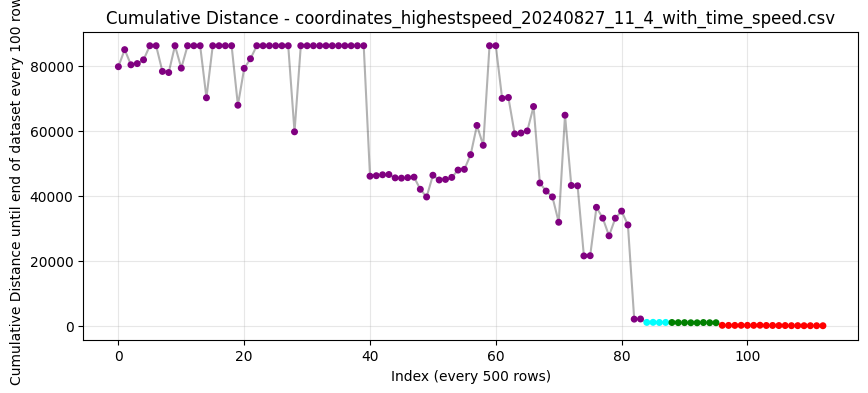

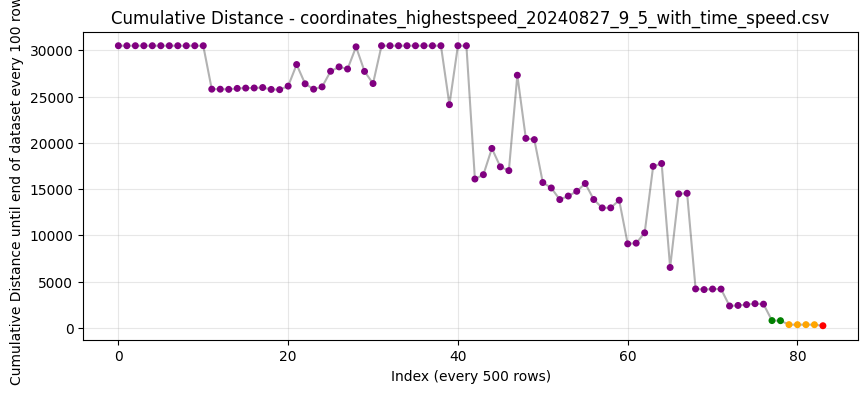

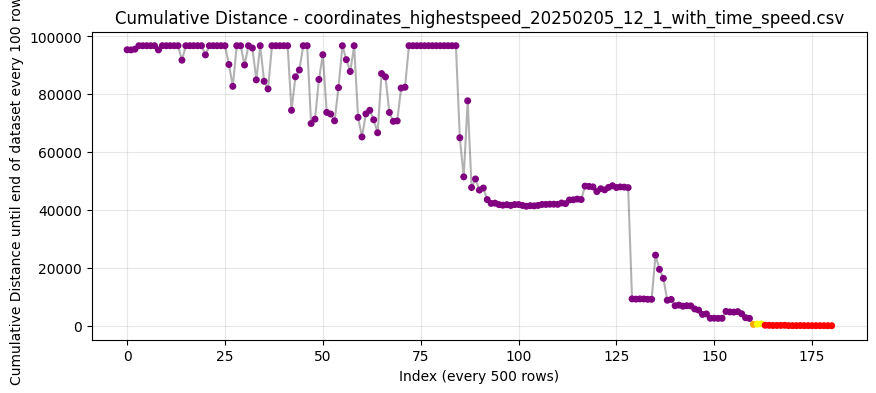

In [41]:
for file in files1 :
    file_path = os.path.join(preprocessed_folder, file)
    cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=500, freq2=100, smoothing_window=15)

Now it seems coherent, let's try several parameters before computing on all files.

Trying different smoothing windows: 15, 30, 50


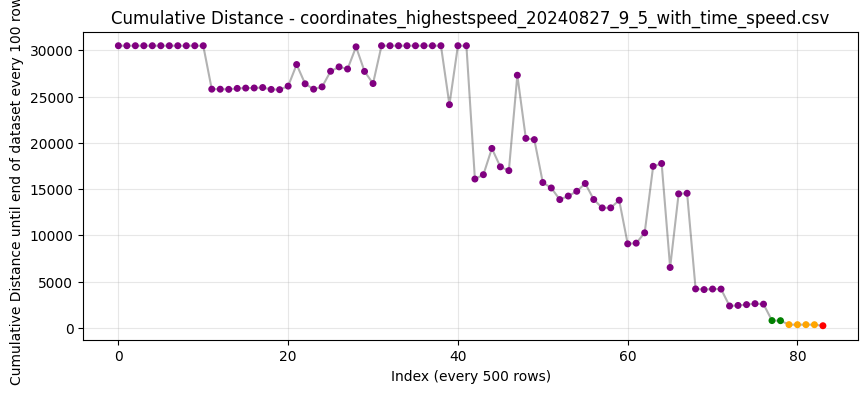

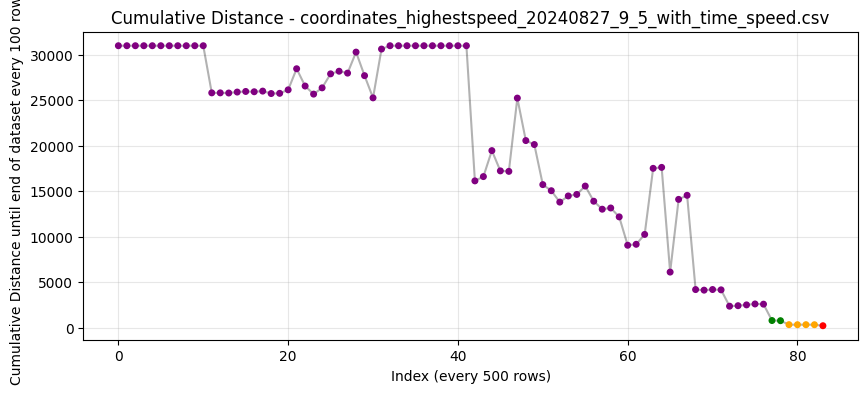

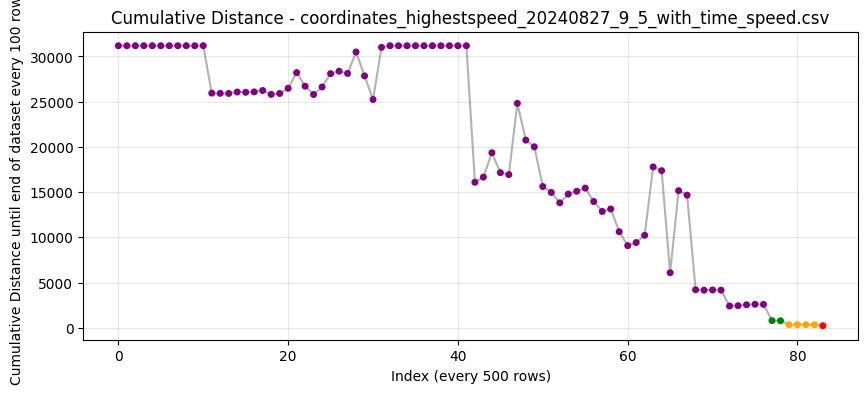

In [42]:
print("Trying different smoothing windows: 15, 30, 50")

file_path = os.path.join(preprocessed_folder, files1[1])
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=500, freq2=100, smoothing_window=15)
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=500, freq2=100, smoothing_window=30)
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=500, freq2=100, smoothing_window=50)

All three windows (15, 30, 50) seem to give similar results, let's keep the smallest one to avoid smoothing too much and losing relevant information.

Trying different computing frequencies: 100, 250, 500


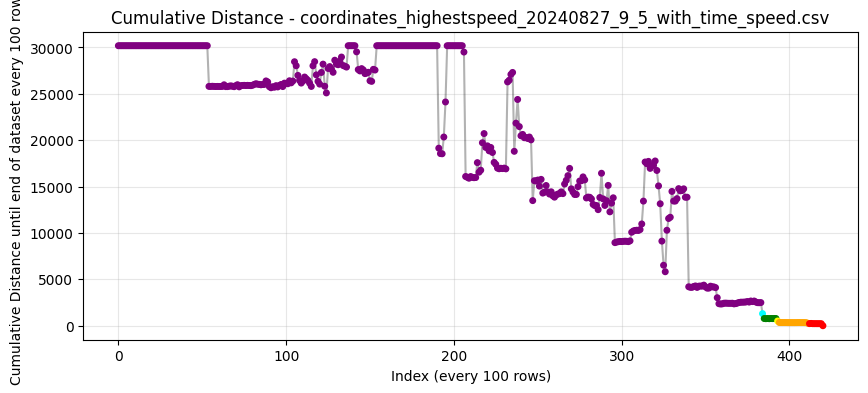

Runtime for freq1=100: 70.54 seconds


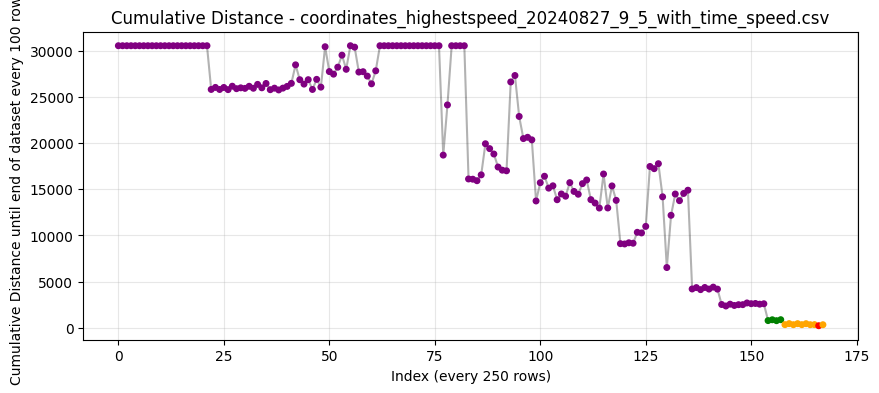

Runtime for freq1=250: 28.54 seconds


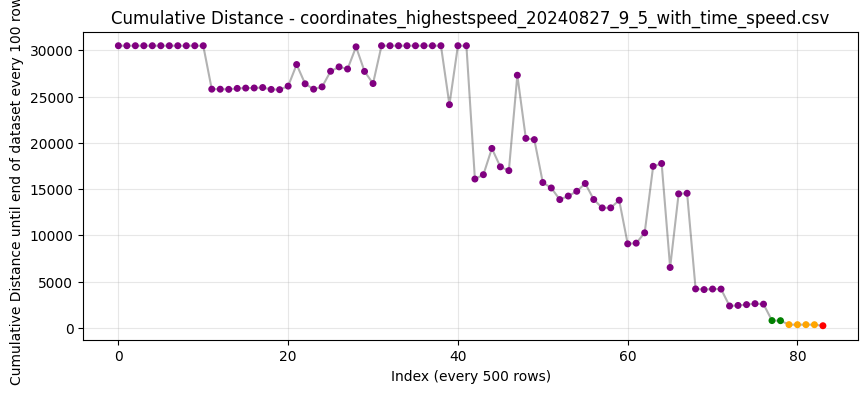

Runtime for freq1=500: 14.57 seconds


In [43]:
print("Trying different computing frequencies: 100, 250, 500")

file_path = os.path.join(preprocessed_folder, files1[1])

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=100, freq2=100, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq1=100: {end_time - start_time:.2f} seconds")

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=250, freq2=100, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq1=250: {end_time - start_time:.2f} seconds")

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=500, freq2=100, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq1=500: {end_time - start_time:.2f} seconds")

Trying different cumulative frequencies (with freq1=200): 50, 100, 150, 200, 300


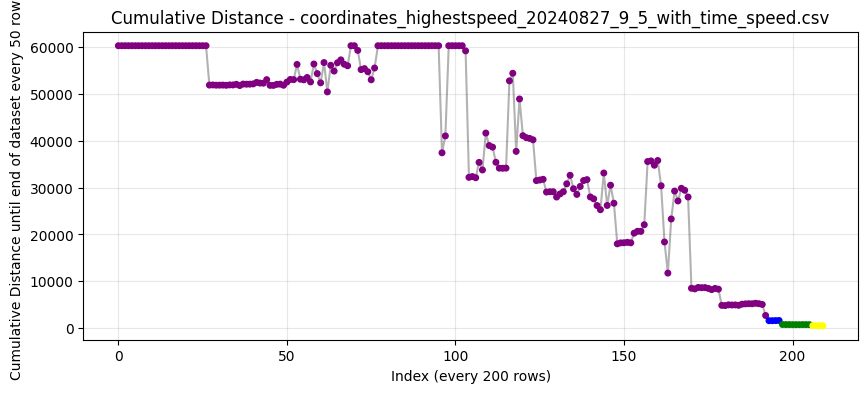

Runtime for freq2=50: 71.65 seconds


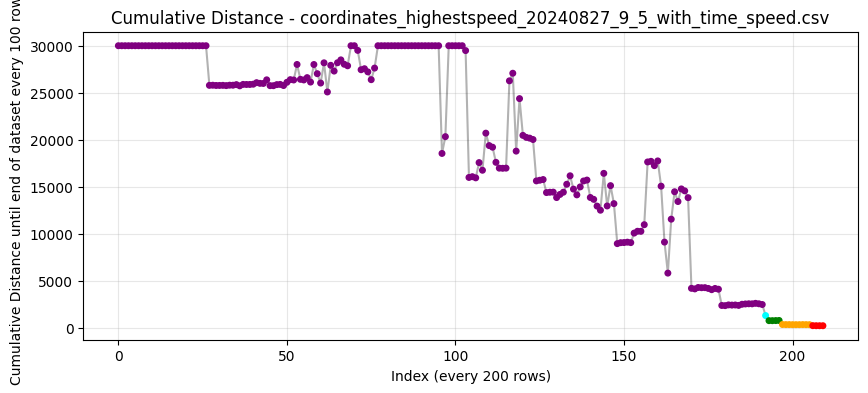

Runtime for freq2=100: 36.76 seconds


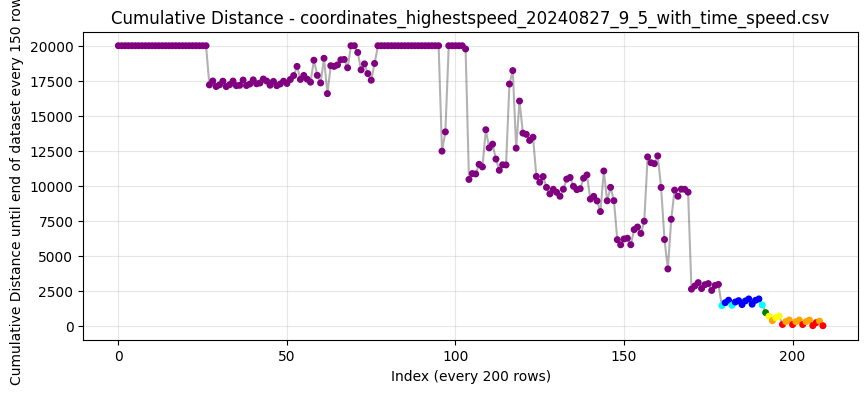

Runtime for freq2=150: 24.33 seconds


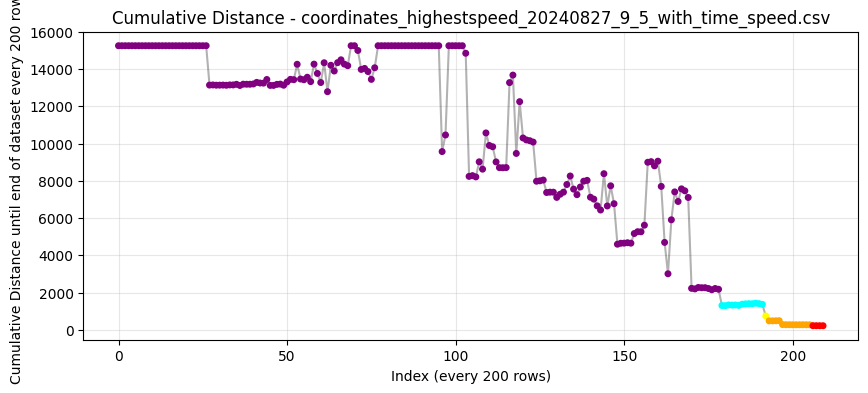

Runtime for freq2=200: 18.65 seconds


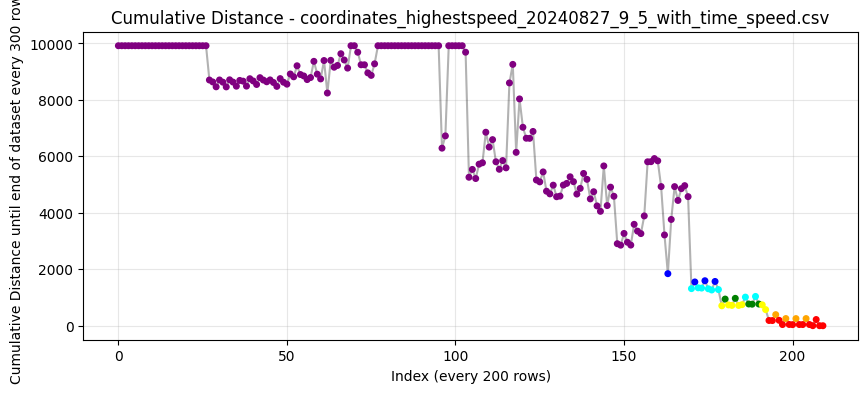

Runtime for freq2=300: 12.21 seconds


In [44]:
print("Trying different cumulative frequencies (with freq1=200): 50, 100, 150, 200, 300")

file_path = os.path.join(preprocessed_folder, files1[1])

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=200, freq2=50, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq2=50: {end_time - start_time:.2f} seconds")

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=200, freq2=100, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq2=100: {end_time - start_time:.2f} seconds")

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=200, freq2=150, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq2=150: {end_time - start_time:.2f} seconds")

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=200, freq2=200, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq2=200: {end_time - start_time:.2f} seconds")

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=200, freq2=300, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq2=300: {end_time - start_time:.2f} seconds")

We can interpret the sinusoidal shape of the cumulative distance at freq2=150 and freq2=300 as a consequence of the filming period of 900 frames. Excluding these frequencies, we see that the shape is very similar between 50, 100 and 200, hence we will freq2=200 to reduce the computing time.

Trying different computing frequencies (with freq2=200): 50, 100, 200


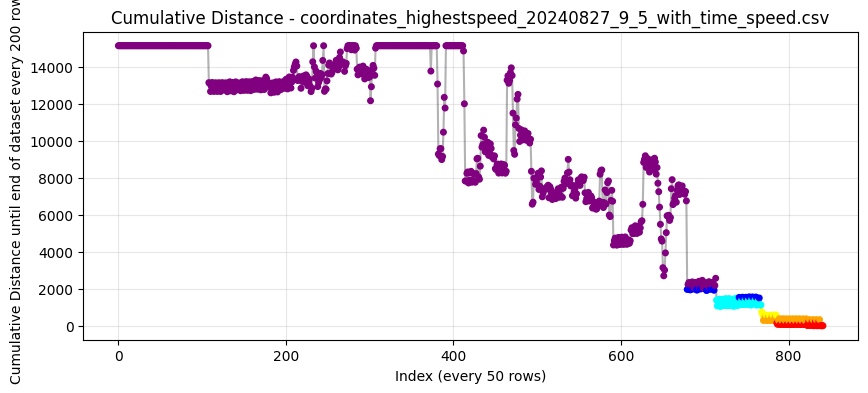

Runtime for freq1=50: 72.06 seconds


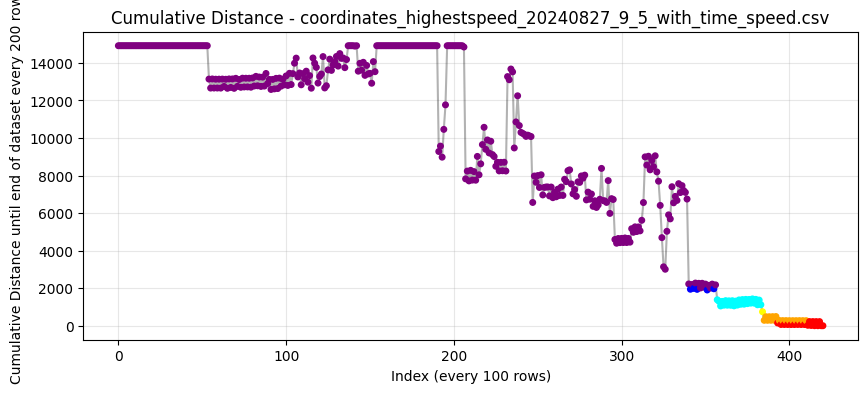

Runtime for freq1=100: 36.36 seconds


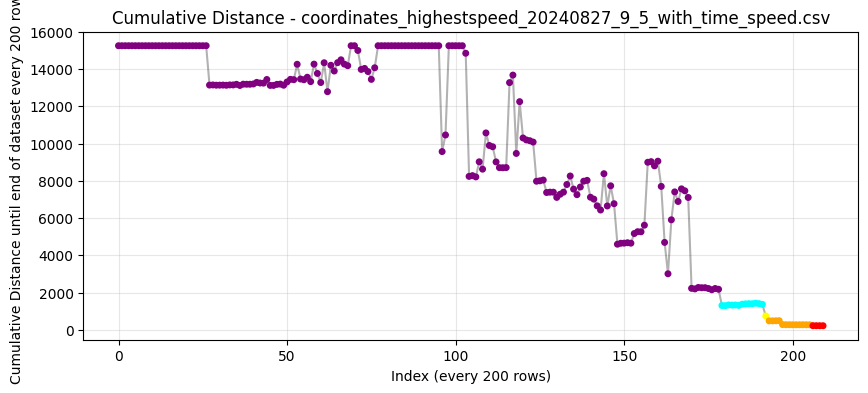

Runtime for freq1=200: 18.40 seconds


In [45]:
print("Trying different computing frequencies (with freq2=200): 50, 100, 200")

file_path = os.path.join(preprocessed_folder, files1[1])

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=50, freq2=200, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq1=50: {end_time - start_time:.2f} seconds")

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=100, freq2=200, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq1=100: {end_time - start_time:.2f} seconds")

start_time = time.time()
cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=200, freq2=200, smoothing_window=15)
end_time = time.time()
print(f"Runtime for freq1=200: {end_time - start_time:.2f} seconds")


With both freq1 and freq2 at 200 we cancel any the sinusoidal shape, while allowing a fine enough resolution to have a good indicator of the end of life. We will keep these parameters for the next steps.

Let's compute on all files to see if the tendency is the same.

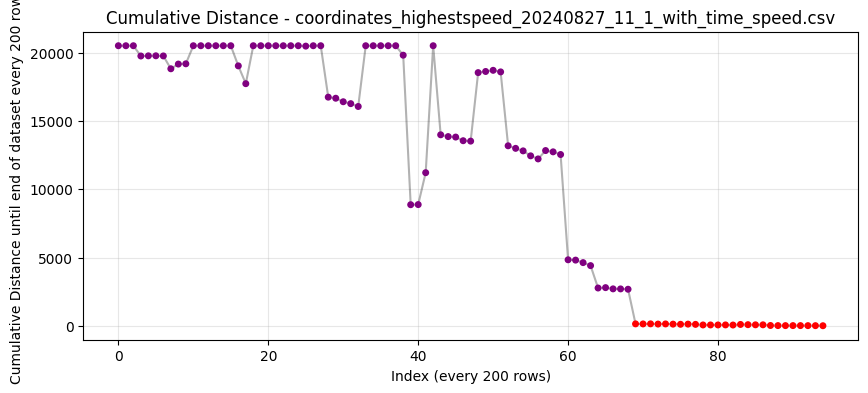

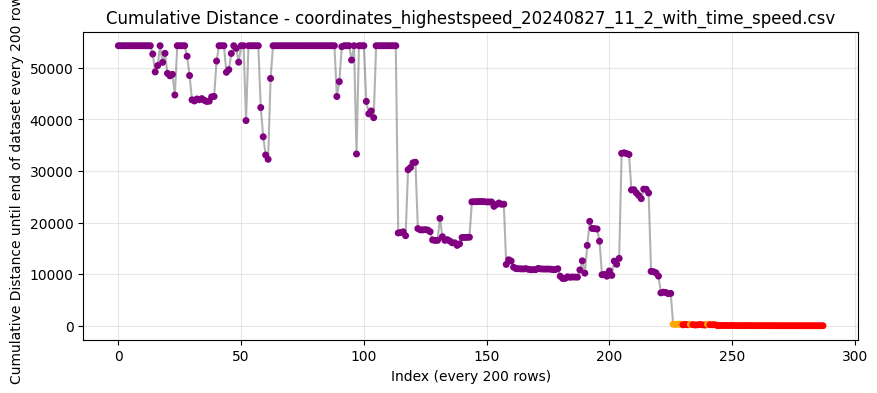

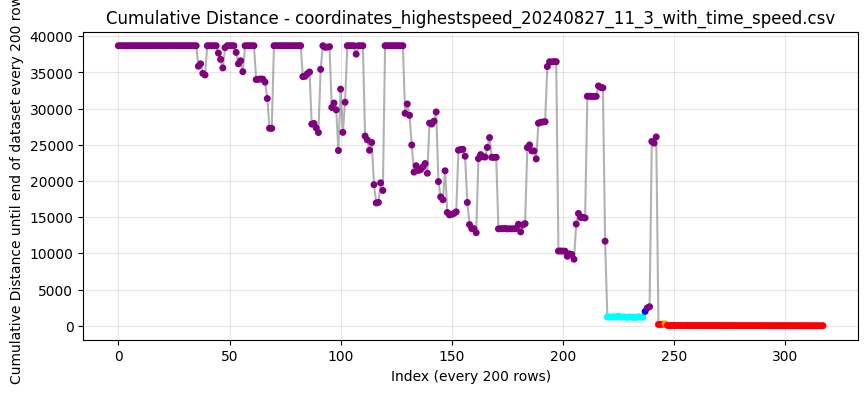

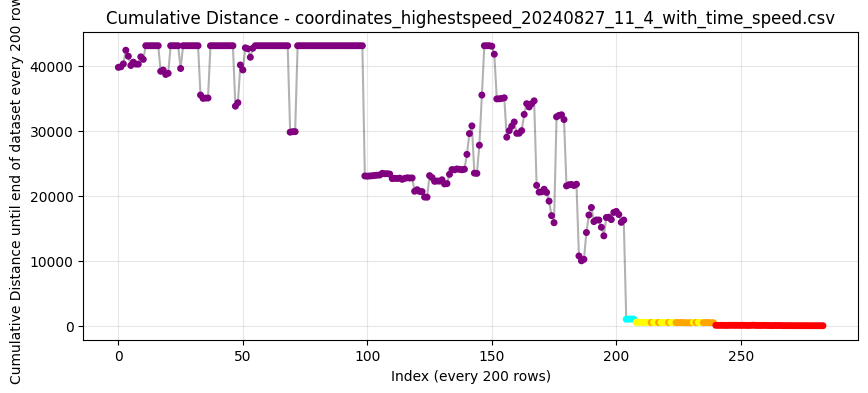

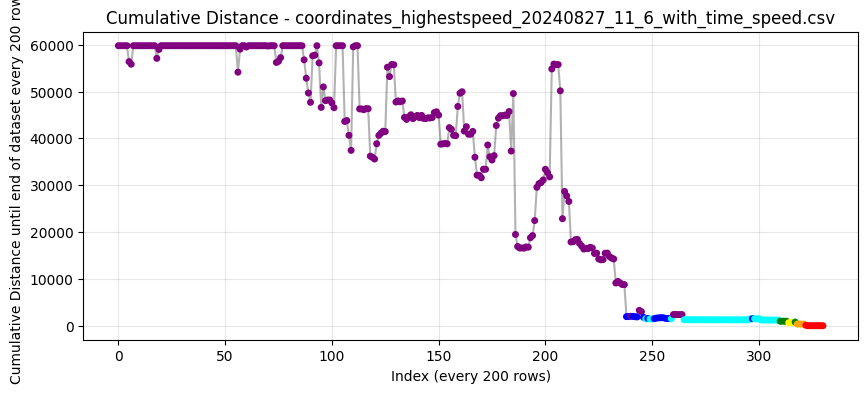

...

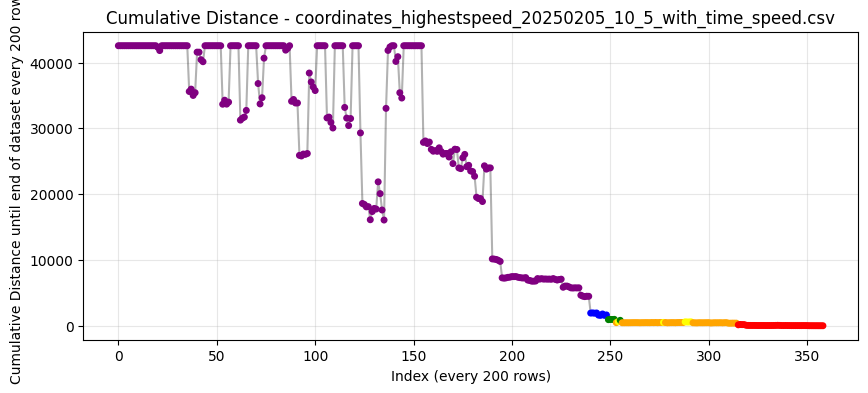

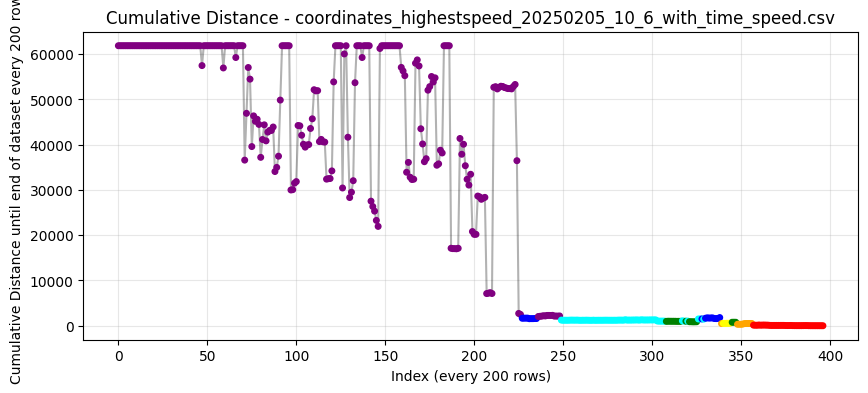

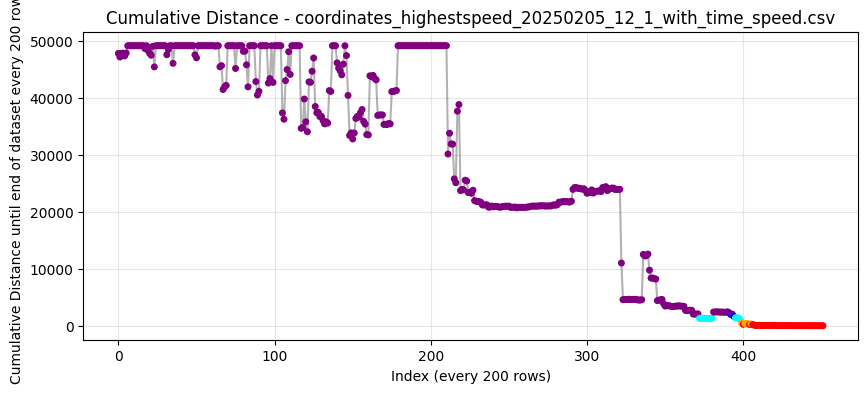

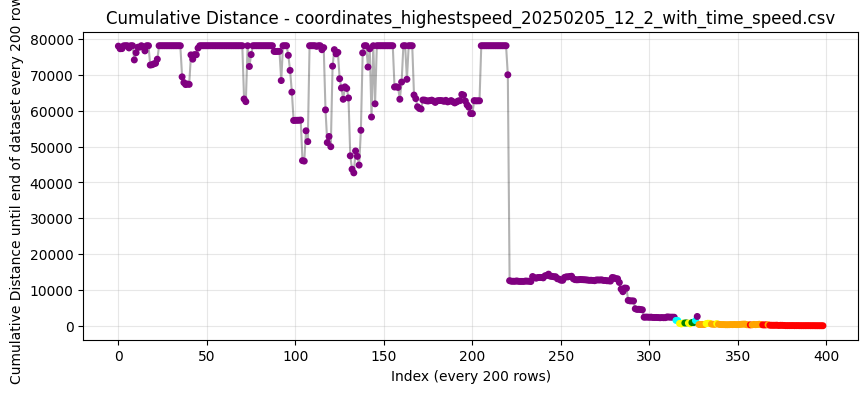

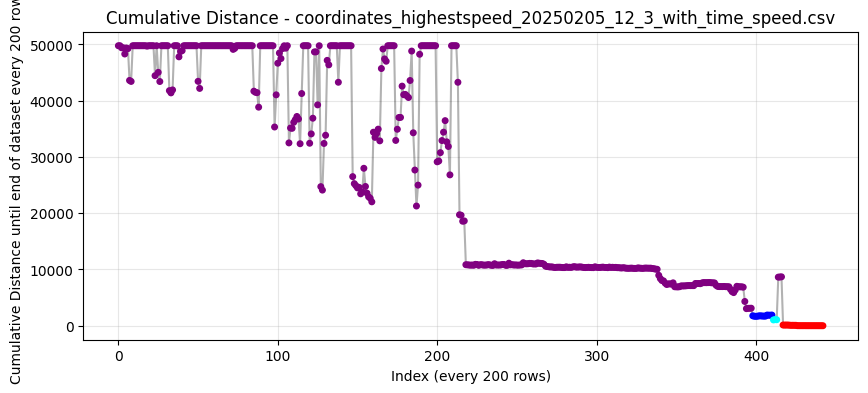

C:\Users\mbera\AppData\Local\Temp\ipykernel_21228\1139451307.py:2: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


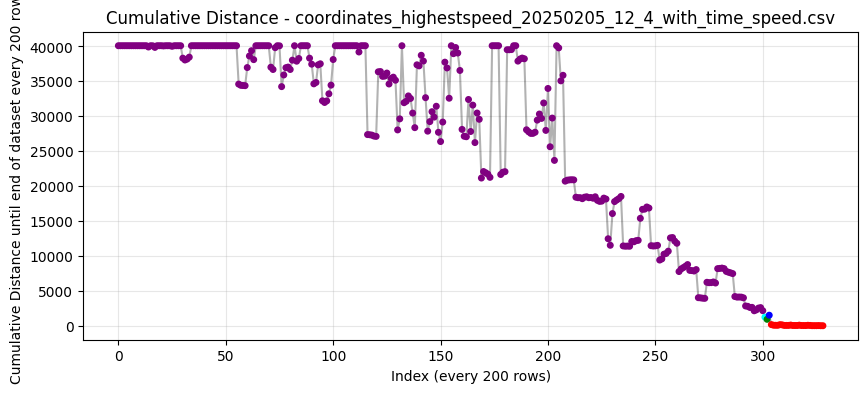

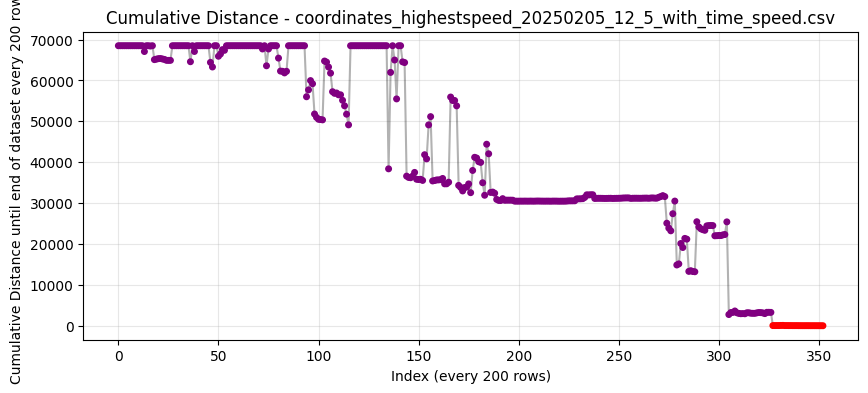

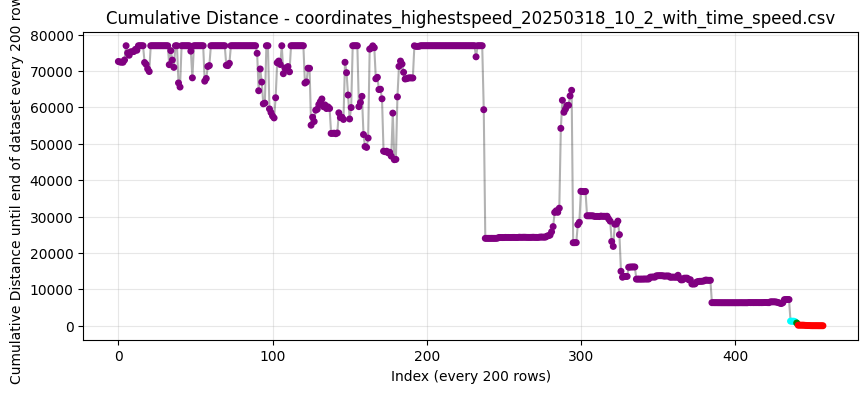

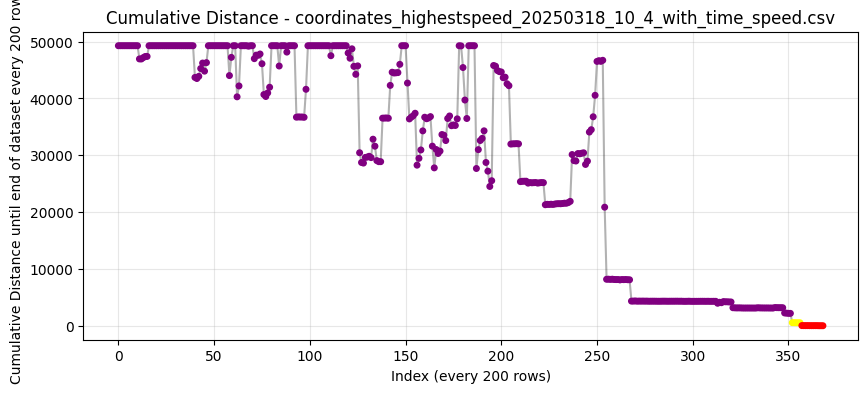

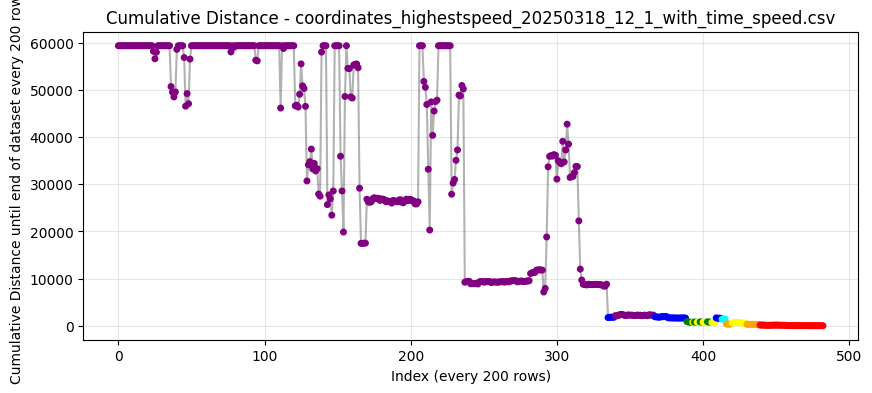

...

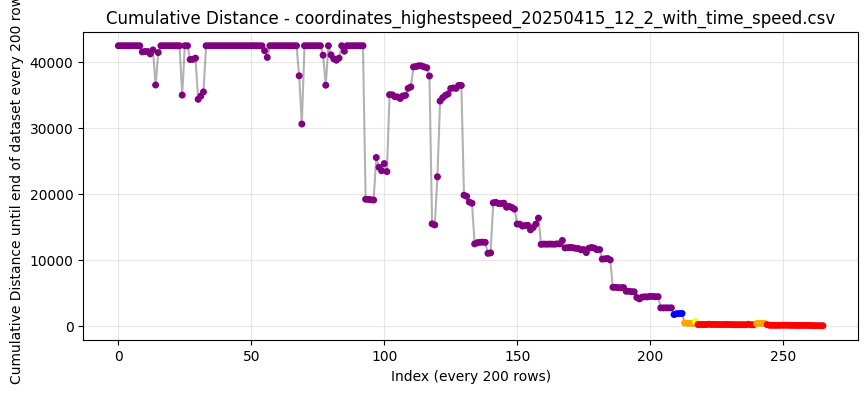

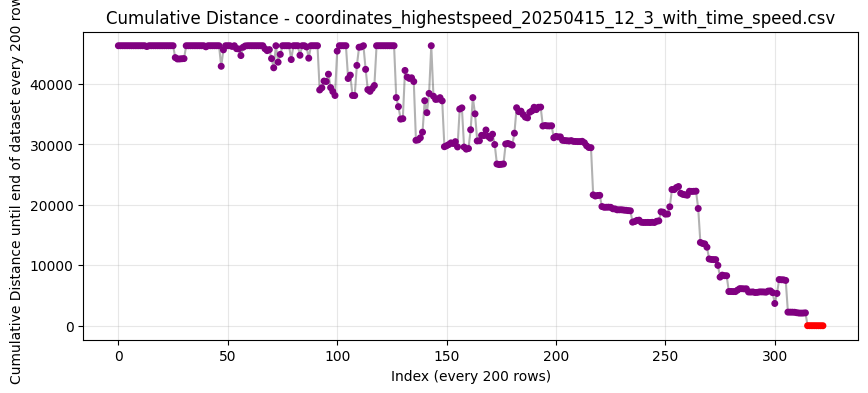

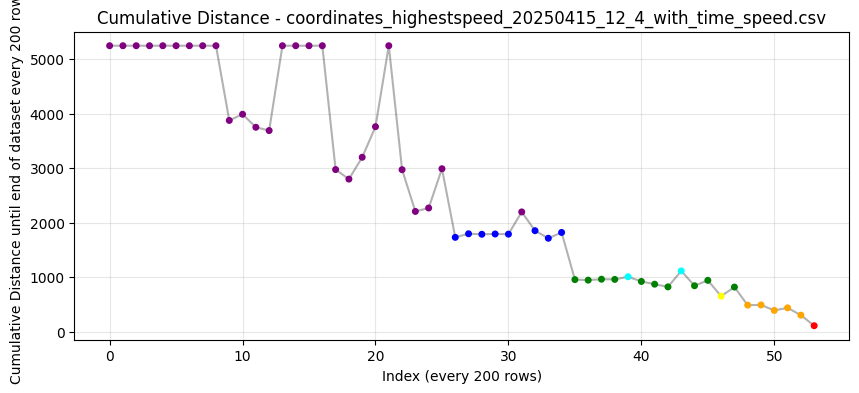

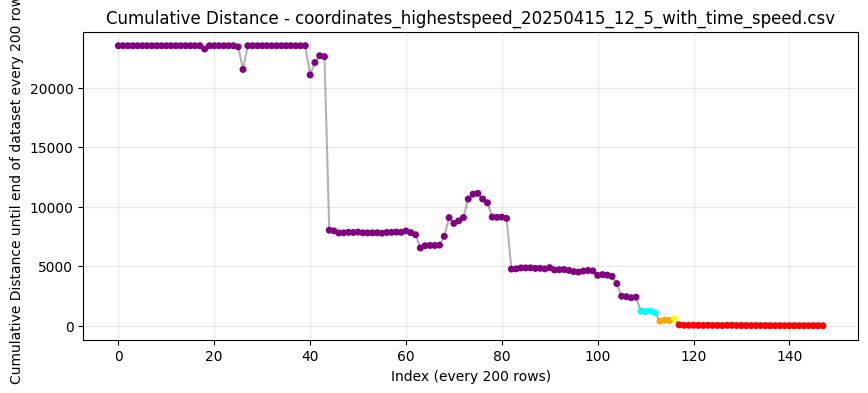

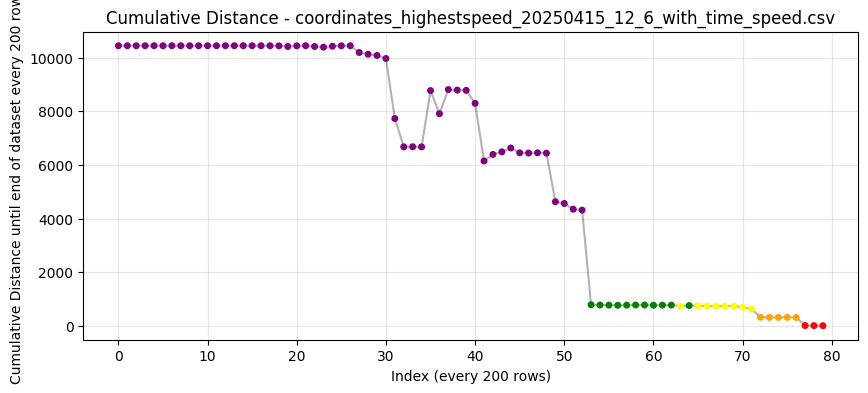

In [46]:
for file in files:
    file_path = os.path.join(preprocessed_folder, file)

    cumulative_distances = compute_total_smooth_cumulative_distance(file_path, freq1=200, freq2=200, smoothing_window=15)
